# Customer Segmentation for Marketing Strategy

The objective of this project is to develop a customer segmentation model to enhance and simplify marketing strategy. The dataset provided summarizes the usage behavior of approximately 9,000 active credit card holders over the past six months. It includes 18 behavioral variables at the customer level.

## Importing dependencies

In [5]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import PowerTransformer
from sklearn.preprocessing import RobustScaler, StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, DBSCAN
from sklearn.metrics import silhouette_score, silhouette_samples
from matplotlib import cm

import itertools
from sklearn.metrics import silhouette_score as ss

In [6]:
# Loading the data
data = pd.read_csv(r'/content/drive/MyDrive/Documents/Machine Learning/CC GENERAL.csv')
data.head()

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


# Data exploration & data processing (Cleaning)

In [7]:
data.shape

(8950, 18)

In [8]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8950 entries, 0 to 8949
Data columns (total 18 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   CUST_ID                           8950 non-null   object 
 1   BALANCE                           8950 non-null   float64
 2   BALANCE_FREQUENCY                 8950 non-null   float64
 3   PURCHASES                         8950 non-null   float64
 4   ONEOFF_PURCHASES                  8950 non-null   float64
 5   INSTALLMENTS_PURCHASES            8950 non-null   float64
 6   CASH_ADVANCE                      8950 non-null   float64
 7   PURCHASES_FREQUENCY               8950 non-null   float64
 8   ONEOFF_PURCHASES_FREQUENCY        8950 non-null   float64
 9   PURCHASES_INSTALLMENTS_FREQUENCY  8950 non-null   float64
 10  CASH_ADVANCE_FREQUENCY            8950 non-null   float64
 11  CASH_ADVANCE_TRX                  8950 non-null   int64  
 12  PURCHA

In [9]:
# rounding numericals values to 2 decimal places and dropping customer ID column, which has no value to this problem
df1 = round(data.drop(columns = 'CUST_ID'), 2)
df1.head(3)

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,40.90,0.82,95.40,0.00,95.4,0.00,0.17,0.0,0.08,0.00,0,2,1000.0,201.80,139.51,0.00,12
1,3202.47,0.91,0.00,0.00,0.0,6442.95,0.00,0.0,0.00,0.25,4,0,7000.0,4103.03,1072.34,0.22,12
2,2495.15,1.00,773.17,773.17,0.0,0.00,1.00,1.0,0.00,0.00,0,12,7500.0,622.07,627.28,0.00,12


# Handling Null Values

In [10]:
# check null values
df1.isnull().sum()

BALANCE                               0
BALANCE_FREQUENCY                     0
PURCHASES                             0
ONEOFF_PURCHASES                      0
INSTALLMENTS_PURCHASES                0
CASH_ADVANCE                          0
PURCHASES_FREQUENCY                   0
ONEOFF_PURCHASES_FREQUENCY            0
PURCHASES_INSTALLMENTS_FREQUENCY      0
CASH_ADVANCE_FREQUENCY                0
CASH_ADVANCE_TRX                      0
PURCHASES_TRX                         0
CREDIT_LIMIT                          1
PAYMENTS                              0
MINIMUM_PAYMENTS                    313
PRC_FULL_PAYMENT                      0
TENURE                                0
dtype: int64

In [11]:
# examine credit limit null value
df1[df1['CREDIT_LIMIT'].isnull() == True]

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
5203,18.4,0.17,0.0,0.0,0.0,186.85,0.0,0.0,0.0,0.17,1,0,NaN,9.04,14.42,0.0,6


In [12]:
# examine minimum payments null values
df1[df1['MINIMUM_PAYMENTS'].isnull() == True]

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
3,1666.67,0.64,1499.00,1499.00,0.0,205.79,0.08,0.08,0.00,0.08,1,1,7500.0,0.00,NaN,0.0,12
45,2242.31,1.00,437.00,97.00,340.0,184.65,0.33,0.08,0.33,0.17,2,5,2400.0,0.00,NaN,0.0,12
47,3910.11,1.00,0.00,0.00,0.0,1980.87,0.00,0.00,0.00,0.50,7,0,4200.0,0.00,NaN,0.0,12
54,6.66,0.64,310.00,0.00,310.0,0.00,0.67,0.00,0.67,0.00,0,8,1000.0,417.02,NaN,0.0,12
55,1312.00,1.00,1283.90,1283.90,0.0,0.00,0.25,0.25,0.00,0.00,0,6,6000.0,0.00,NaN,0.0,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8919,14.52,0.33,152.00,152.00,0.0,0.00,0.33,0.33,0.00,0.00,0,2,1500.0,0.00,NaN,0.0,6
8929,371.53,0.33,0.00,0.00,0.0,1465.41,0.00,0.00,0.00,0.17,5,0,1500.0,0.00,NaN,0.0,6
8935,183.82,1.00,465.90,0.00,465.9,0.00,1.00,0.00,0.83,0.00,0,6,1500.0,0.00,NaN,0.0,6
8944,193.57,0.83,1012.73,1012.73,0.0,0.00,0.33,0.33,0.00,0.00,0,2,4000.0,0.00,NaN,0.0,6


Addressing the null values in the dataset:

**Credit Limit**: I replaced the null values with 0, assuming that these records might represent individuals who did not qualify for a credit limit at the time.

**Minimum Payment**: I filled the null values with 0, considering the possibility that these individuals might not have made any payments. While this assumption may not cover all cases, it provides a reasonable placeholder.

In [13]:
df1['CREDIT_LIMIT'].fillna(0, inplace = True)

In [14]:
df1['MINIMUM_PAYMENTS'].fillna(0, inplace = True)

# Data Visualization

Given that all the columns I have are numerical, it is important to check the distribution of the columns to spot the outliars, and also to check if there is normal distribution.

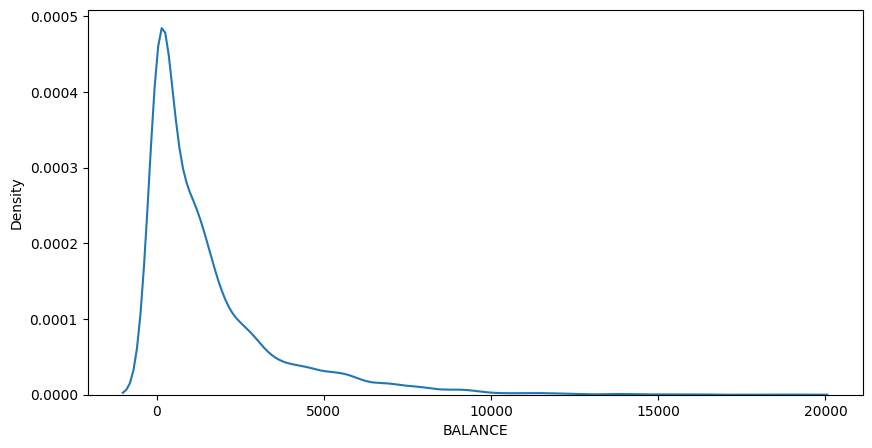

<Figure size 640x480 with 0 Axes>

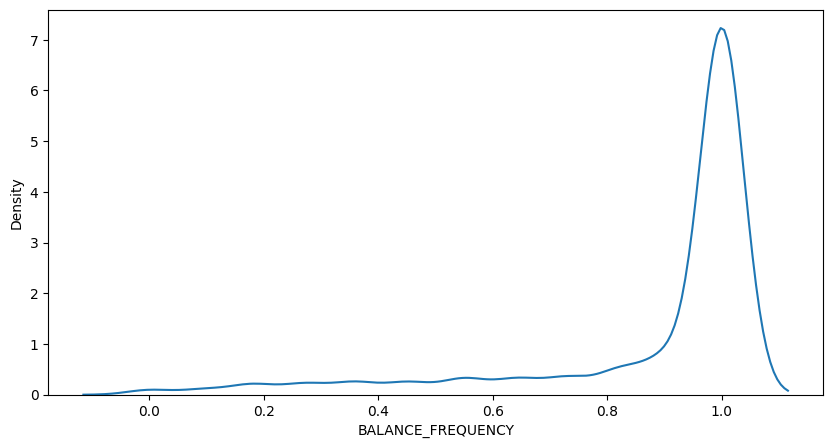

<Figure size 640x480 with 0 Axes>

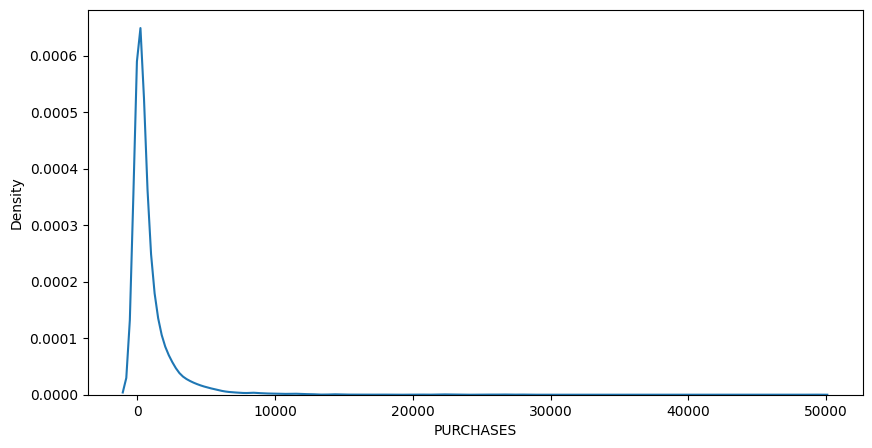

<Figure size 640x480 with 0 Axes>

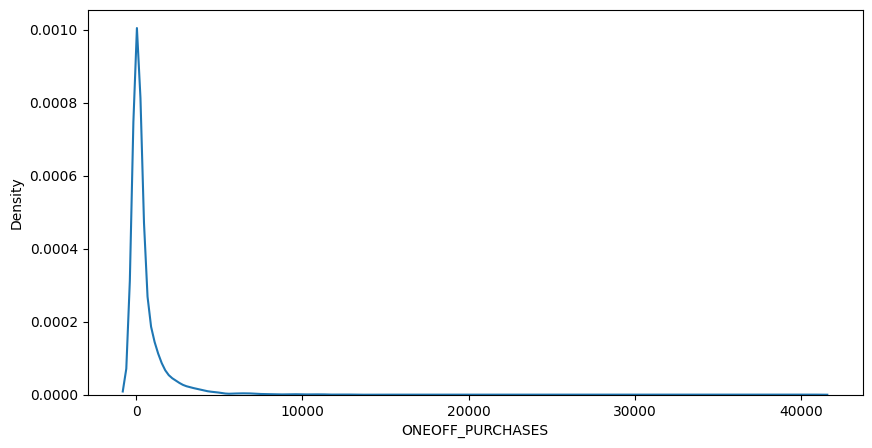

<Figure size 640x480 with 0 Axes>

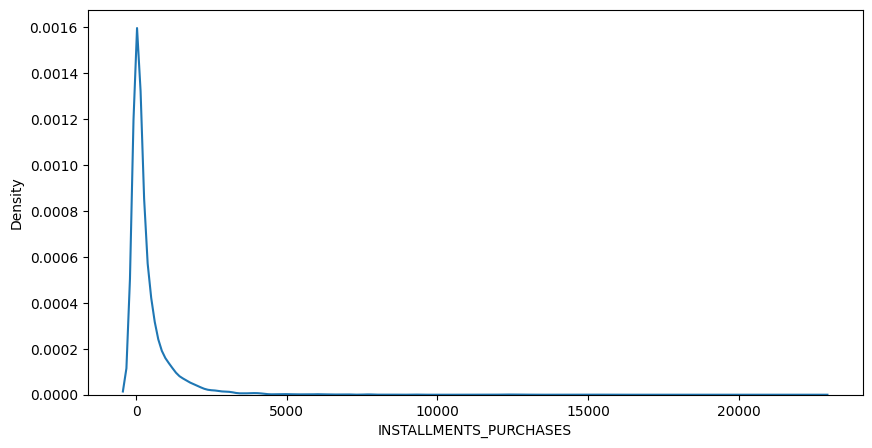

<Figure size 640x480 with 0 Axes>

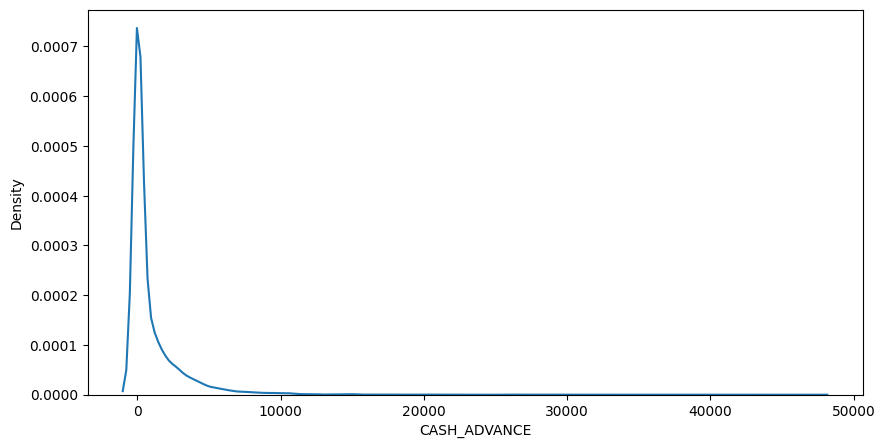

<Figure size 640x480 with 0 Axes>

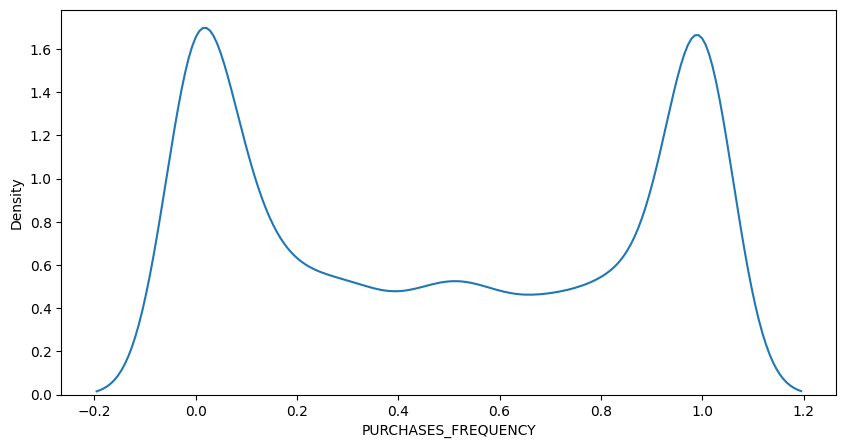

<Figure size 640x480 with 0 Axes>

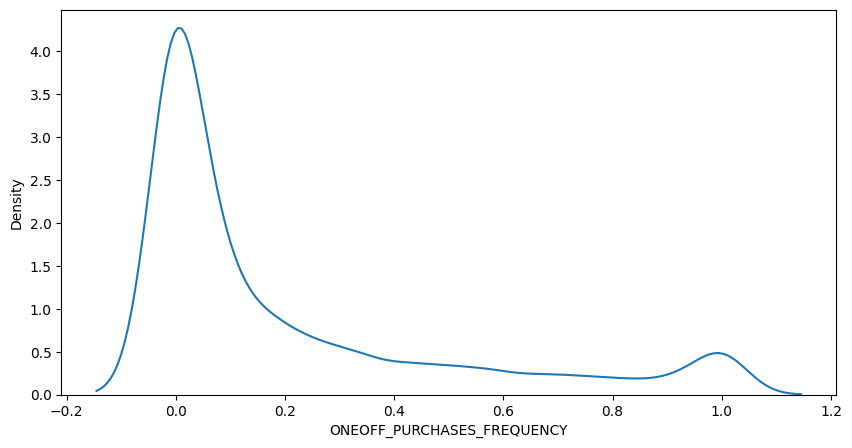

<Figure size 640x480 with 0 Axes>

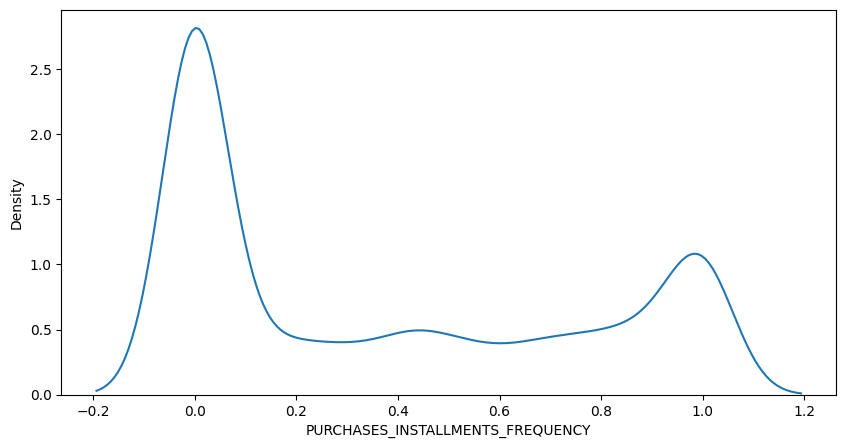

<Figure size 640x480 with 0 Axes>

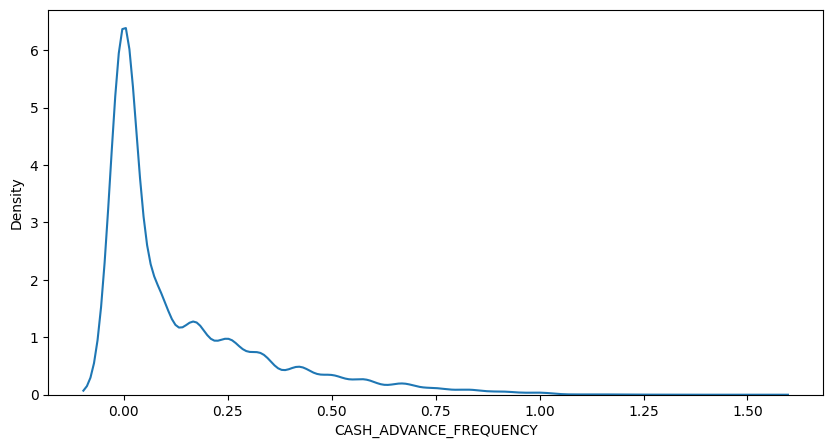

<Figure size 640x480 with 0 Axes>

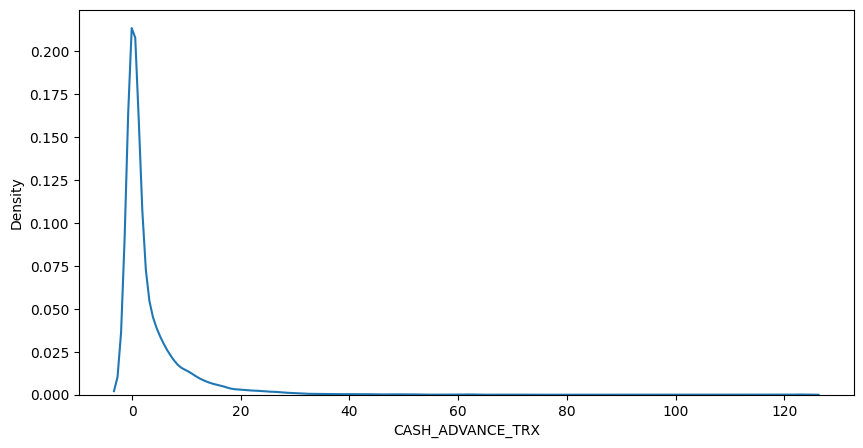

<Figure size 640x480 with 0 Axes>

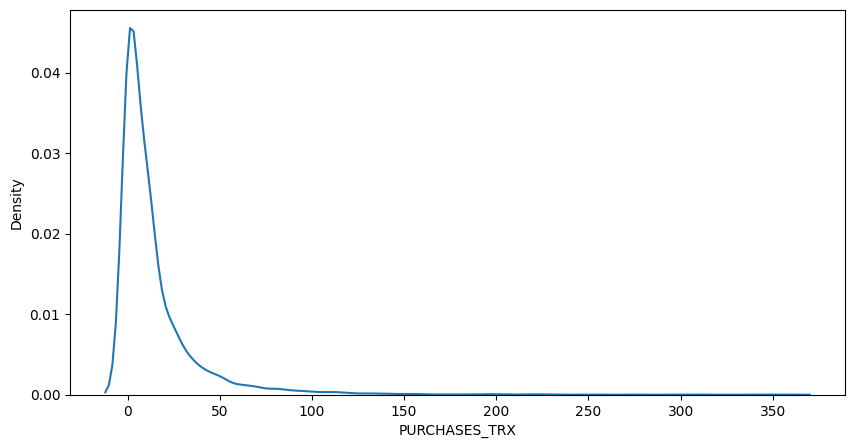

<Figure size 640x480 with 0 Axes>

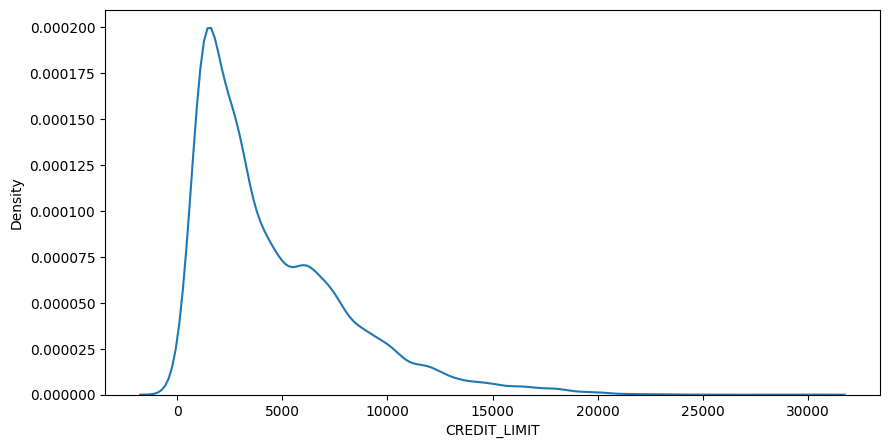

<Figure size 640x480 with 0 Axes>

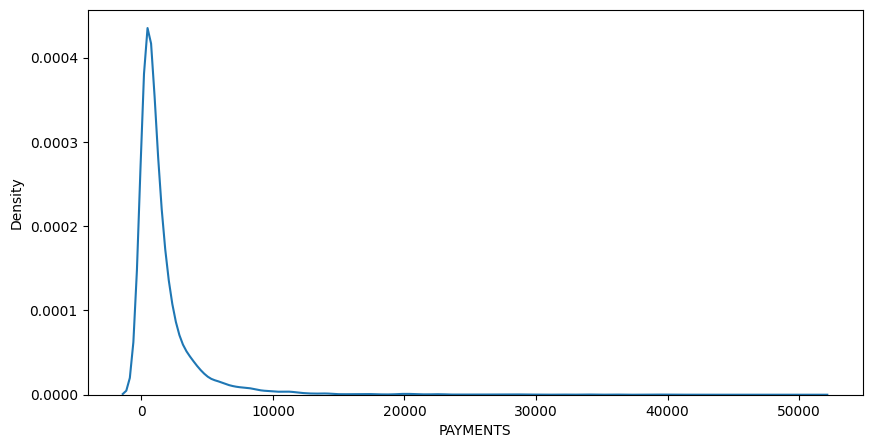

<Figure size 640x480 with 0 Axes>

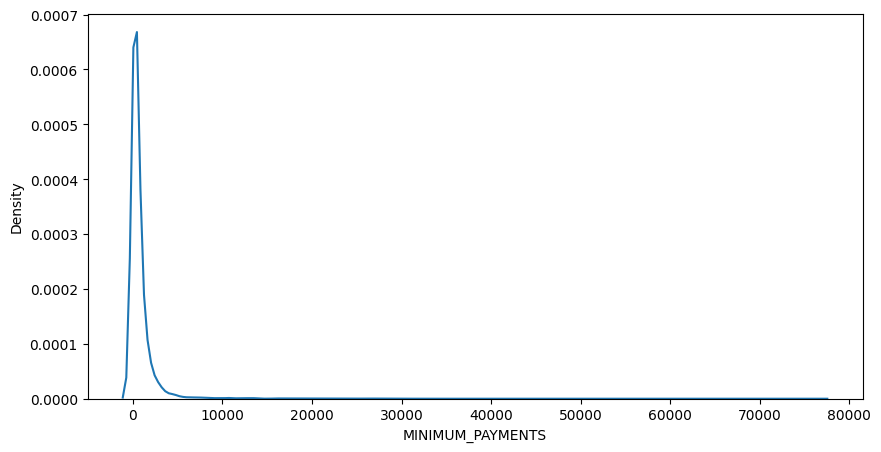

<Figure size 640x480 with 0 Axes>

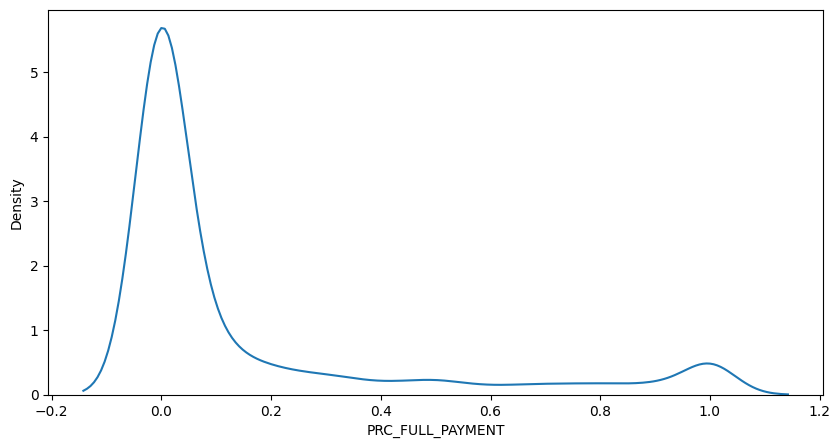

<Figure size 640x480 with 0 Axes>

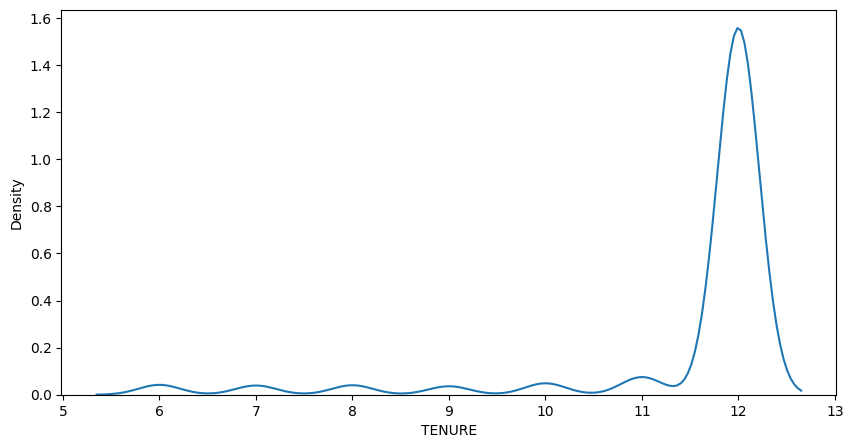

<Figure size 640x480 with 0 Axes>

In [15]:
for col in df1.columns:
  plt.figure(figsize= (10, 5))
  sns.kdeplot(data = df1, x = col)
  plt.show()
  plt.tight_layout()

# Power Transformer to deal with skewed distribution

Given that most of the features exhibit skewed distributions, a power transformation will be performed to normalize these features for the models.

In [16]:
pt = PowerTransformer(method = 'yeo-johnson')
pt_df = pt.fit_transform(df1)

In [17]:
df2 = pd.DataFrame(data = pt_df, columns = df1.columns)

Visualize the transformed data:

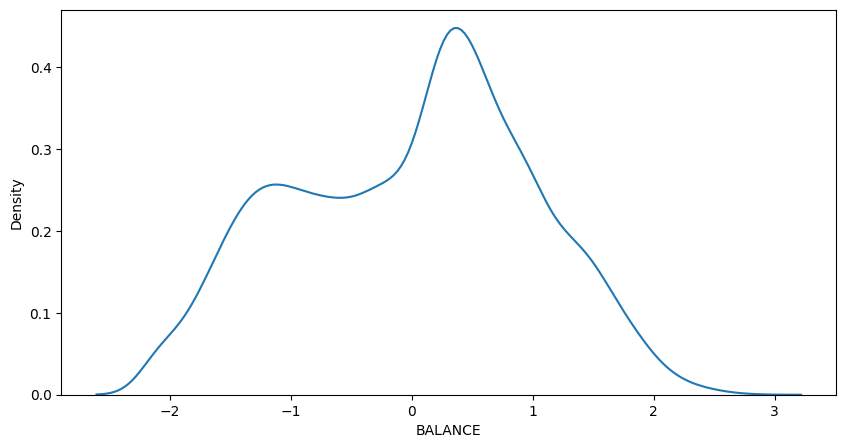

<Figure size 640x480 with 0 Axes>

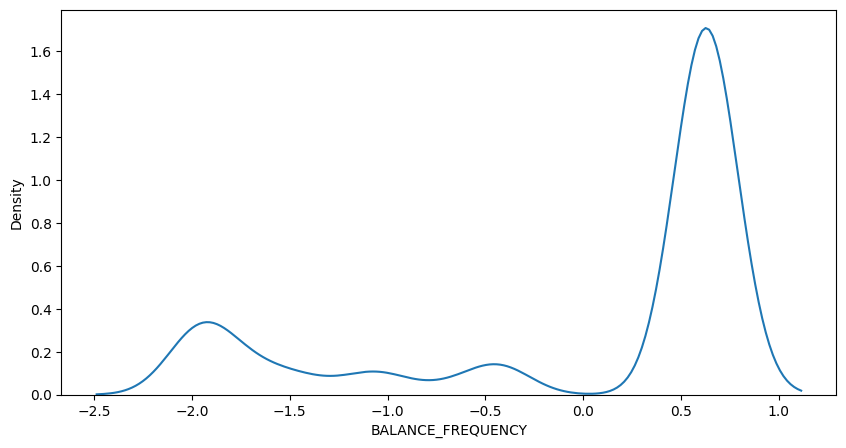

<Figure size 640x480 with 0 Axes>

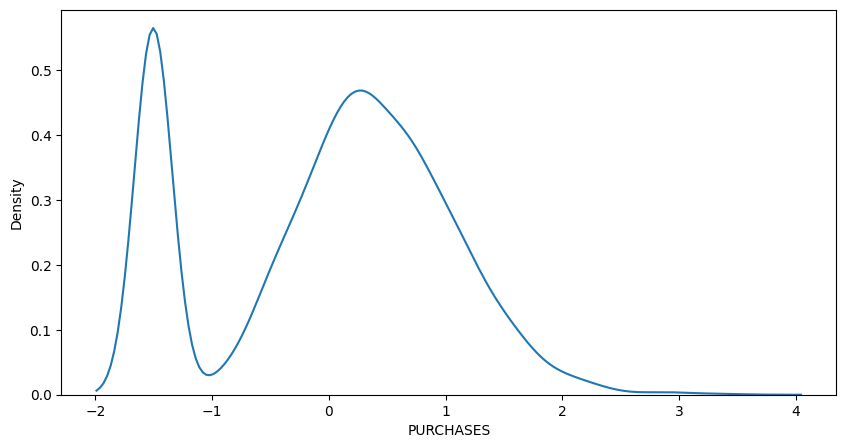

<Figure size 640x480 with 0 Axes>

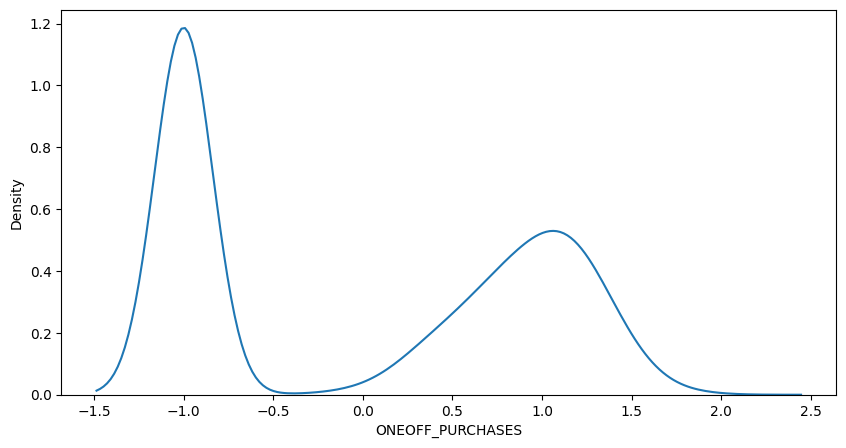

<Figure size 640x480 with 0 Axes>

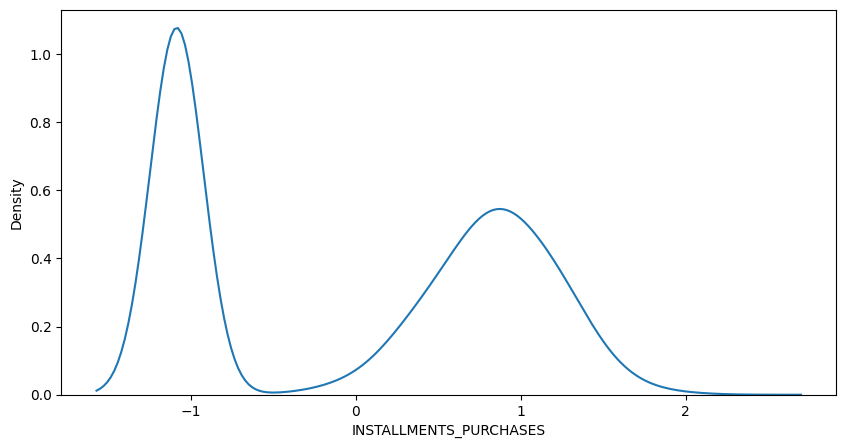

<Figure size 640x480 with 0 Axes>

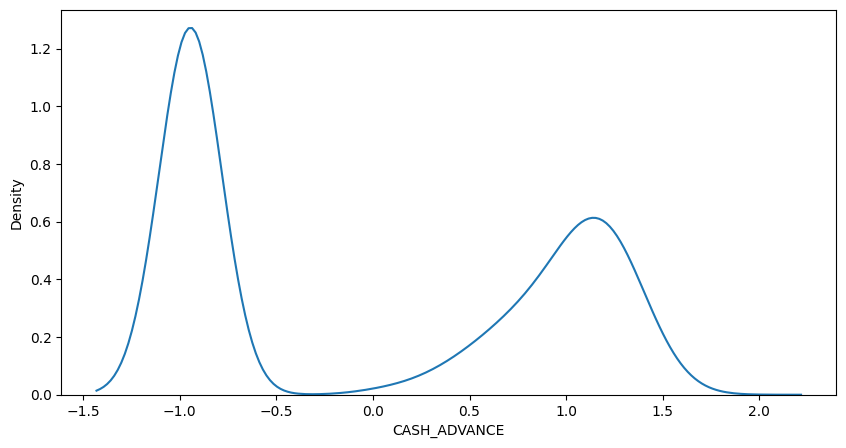

<Figure size 640x480 with 0 Axes>

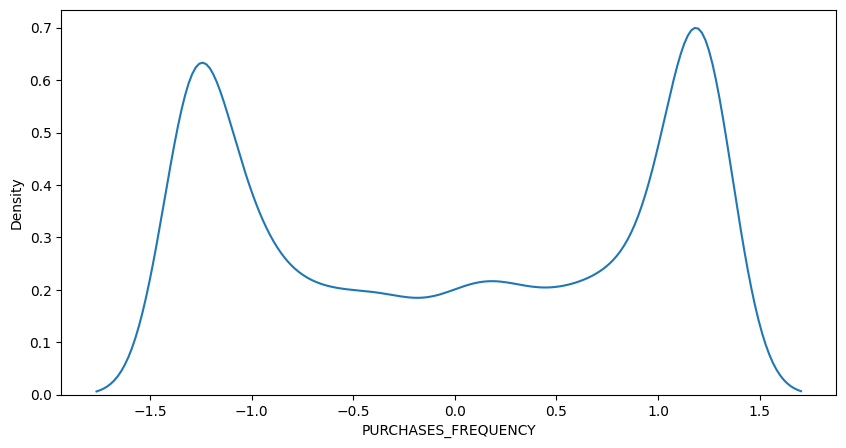

<Figure size 640x480 with 0 Axes>

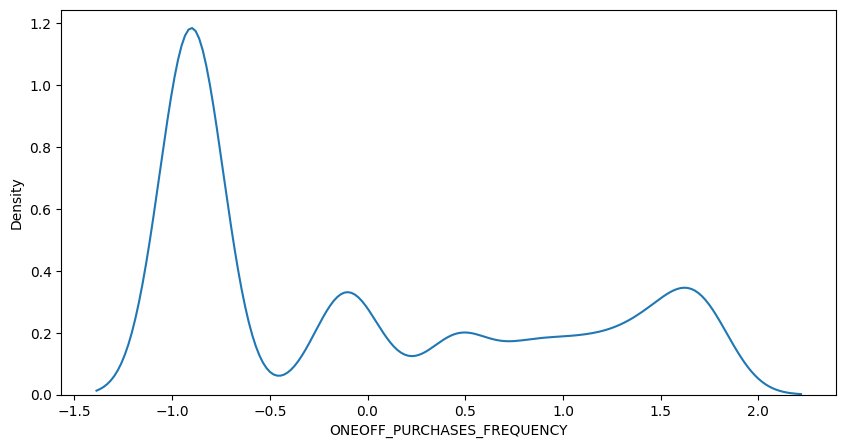

<Figure size 640x480 with 0 Axes>

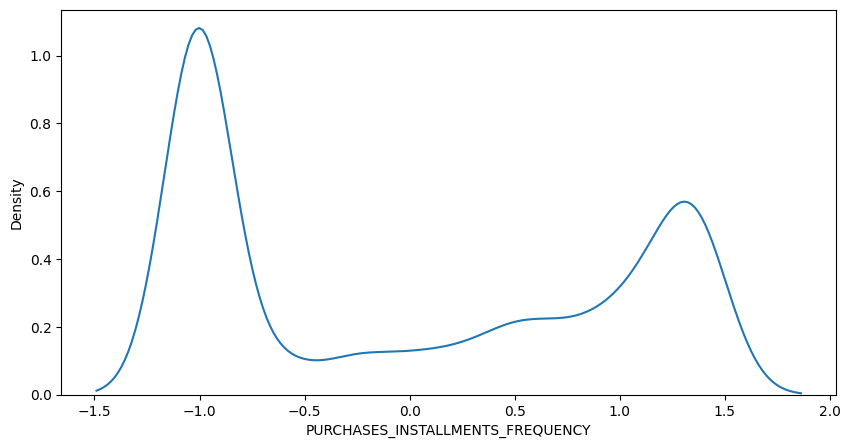

<Figure size 640x480 with 0 Axes>

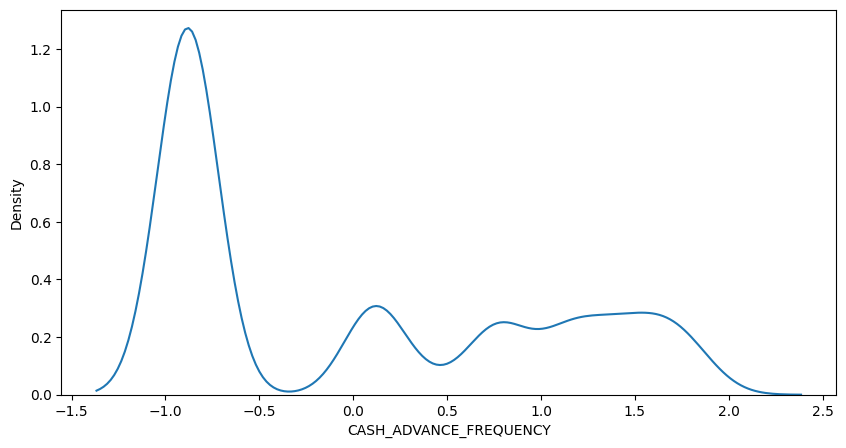

<Figure size 640x480 with 0 Axes>

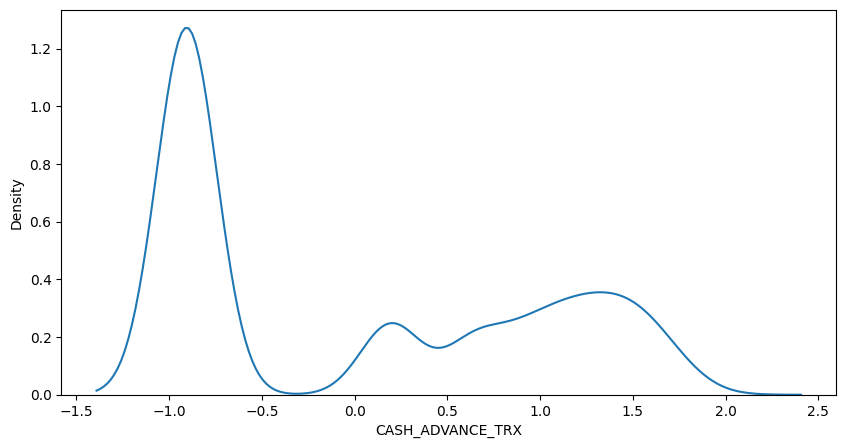

<Figure size 640x480 with 0 Axes>

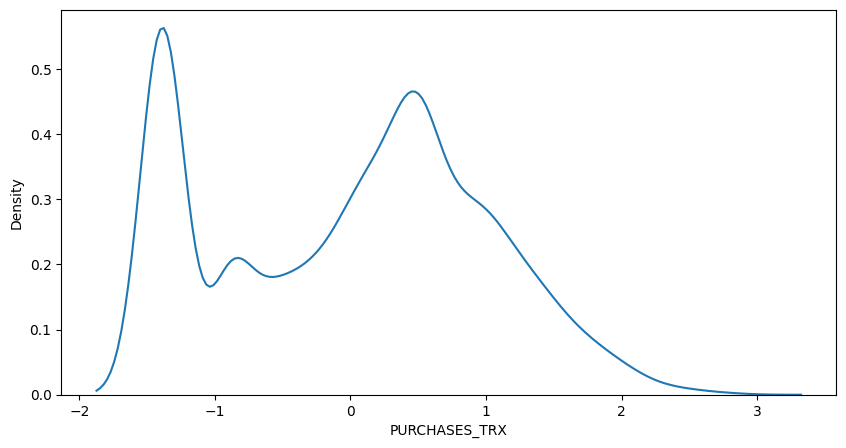

<Figure size 640x480 with 0 Axes>

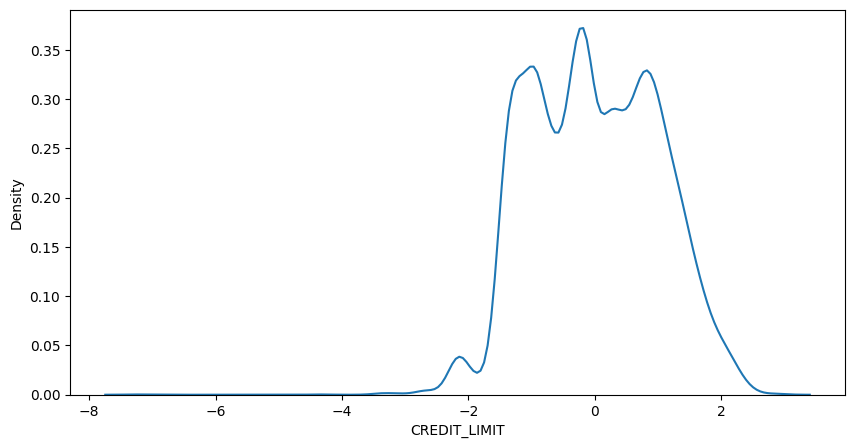

<Figure size 640x480 with 0 Axes>

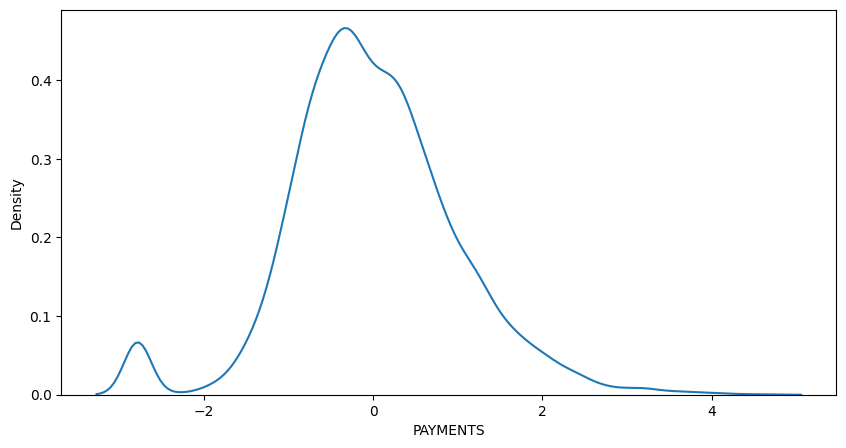

<Figure size 640x480 with 0 Axes>

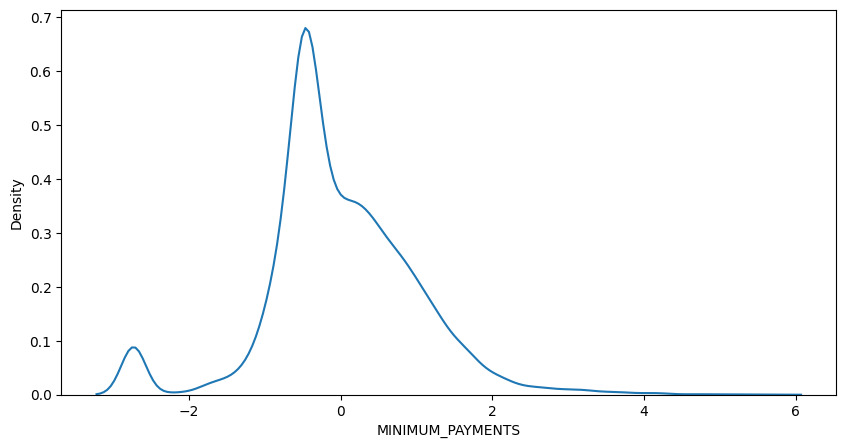

<Figure size 640x480 with 0 Axes>

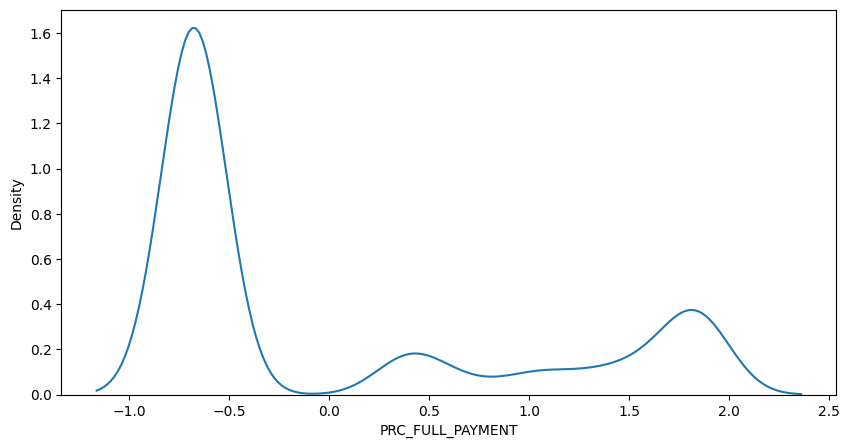

<Figure size 640x480 with 0 Axes>

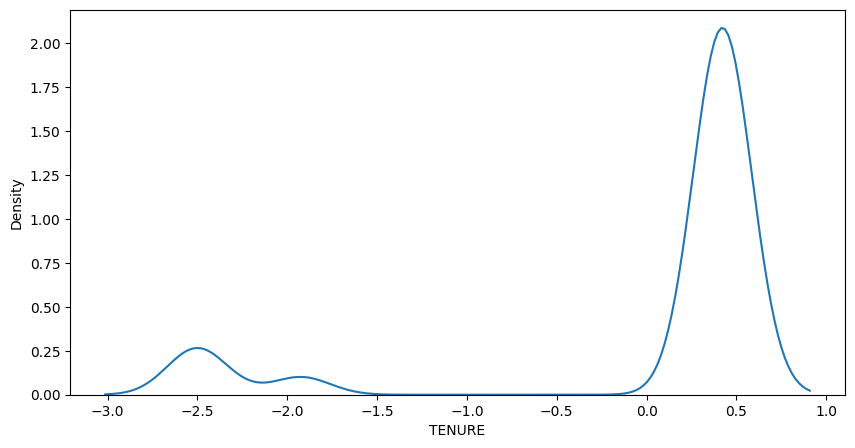

<Figure size 640x480 with 0 Axes>

In [18]:
for col in df2.columns:
  plt.figure(figsize= (10, 5))
  sns.kdeplot(data = df2, x = col)
  plt.show()
  plt.tight_layout()

# Data Pre-Processing and Feature Scaling

To ensure that all features are on a comparable scale, feature scaling will has to be performed next.

In [19]:
# using 3 different scaling techniques.

robust = RobustScaler()
standard_scaler = StandardScaler()
minx_scaler = MinMaxScaler()

rob_df = robust.fit_transform(df2)
stan_df = standard_scaler.fit_transform(df2)
minx_df = minx_scaler.fit_transform(df2)

With the data now normalized and scaled, the next step is to perform Principal Component Analysis (PCA). Given that the dataset contains 17 features, PCA will help reduce the dimensionality and identify the most important components, thus simplifying the model and potentially improving its performance.

In [20]:
# performing PCA on the scaled dataframes

pca = PCA(n_components = 2)

rob_pca = pca.fit_transform(rob_df)
stan_pca = pca.fit_transform(stan_df)
minx_pca = pca.fit_transform(minx_df)

In [21]:
# creating PCA dataframes
rob_feat1, rob_feat2 = rob_pca[:, 0], rob_pca[:, 1]
stan_feat1, stan_feat2 = stan_pca[:, 0], stan_pca[:, 1]
minx_feat1, minx_feat2 = minx_pca[:, 0], minx_pca[:, 1]

rob_pca_df = pd.DataFrame(data = {'feat1' : rob_feat1, 'feat2' : rob_feat2})
stan_pca_df = pd.DataFrame(data = {'feat1' : stan_feat1, 'feat2' : stan_feat2})
minx_pca_df = pd.DataFrame(data = {'feat1' : minx_feat1, 'feat2' : minx_feat2})

Create a scatterplot for the Principal Components

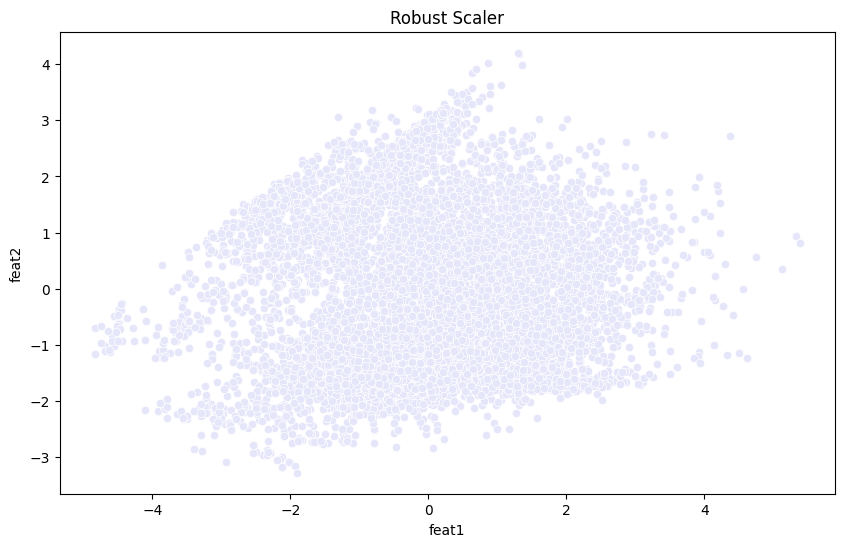

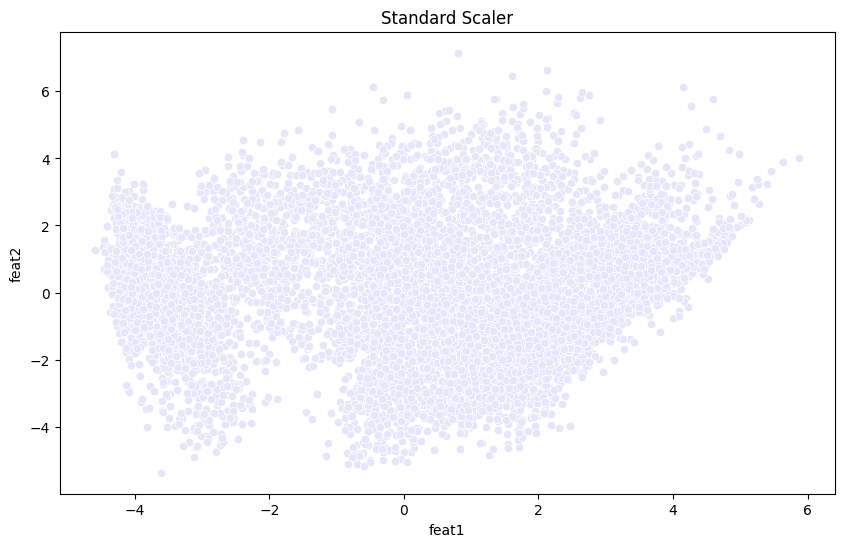

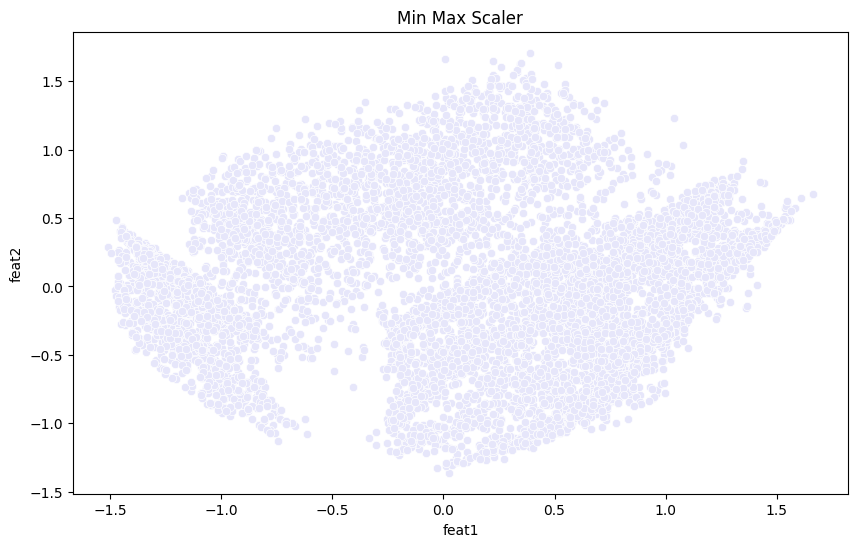

In [22]:
plt.figure(figsize= (10, 6))
plt.title('Robust Scaler')
sns.scatterplot(data = rob_pca_df, x = 'feat1', y = 'feat2', color = 'lavender')
plt.show()

plt.figure(figsize= (10, 6))
plt.title('Standard Scaler')
sns.scatterplot(data = stan_pca_df, x = 'feat1', y = 'feat2', color = 'lavender')
plt.show()

plt.figure(figsize= (10, 6))
plt.title('Min Max Scaler')
sns.scatterplot(data = minx_pca_df, x = 'feat1', y = 'feat2', color = 'lavender')
plt.show()

With the data preprocessed and dimensionality reduced, we will now perform clustering using multiple models. This technique will help to group the data into clusters based on the features, allowing us to identify patterns and segment the dataset into distinct groups.

## KMeans Clustering Model

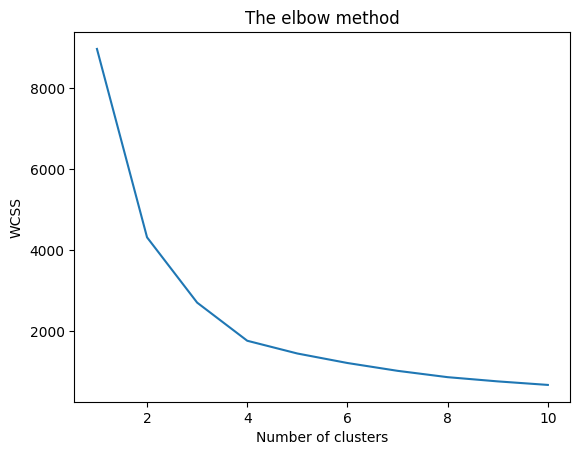

In [23]:
range_n_clusters = [2, 3, 4, 5, 6, 7, 8, 9]

wcss = []     # within cluster sum of square

for i in range(1, 11):
  kmeans = KMeans(n_clusters = i, init = 'k-means++', n_init = 10, random_state = 3)
  kmeans.fit(minx_pca_df)
  wcss.append(kmeans.inertia_)

plt.plot(range(1, 11), wcss)
plt.title('The elbow method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

In [24]:
import warnings

warnings.filterwarnings("ignore", category=FutureWarning)

# Silhouette Analysis on MinMaxScaler

To evaluate the quality of the clusters formed by the KMeans model, we will calculate the Silhouette scores. This metric will help us assess how well each data point fits within its assigned cluster, providing a measure of the clustering performance.

For n_clusters = 2 The average silhouette_score is : 0.47434003341624703
For n_clusters = 3 The average silhouette_score is : 0.44985977284549383
For n_clusters = 4 The average silhouette_score is : 0.4718250109381671
For n_clusters = 5 The average silhouette_score is : 0.44701845469294266
For n_clusters = 6 The average silhouette_score is : 0.41765704231086537
For n_clusters = 7 The average silhouette_score is : 0.4345529746250262
For n_clusters = 8 The average silhouette_score is : 0.409814724508548
For n_clusters = 9 The average silhouette_score is : 0.4006612022865389


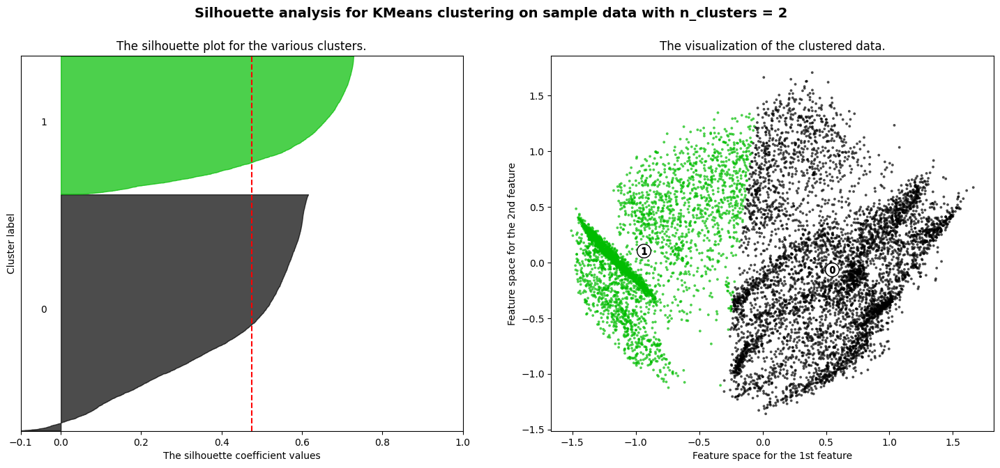

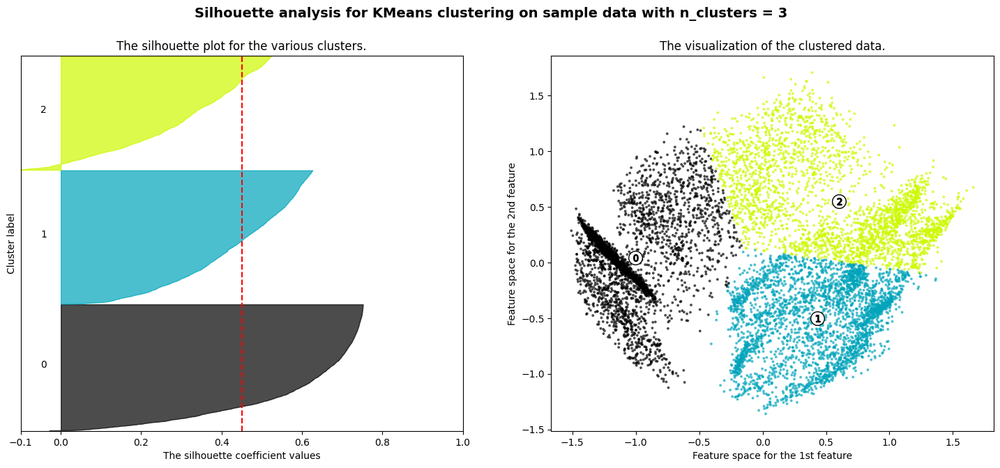

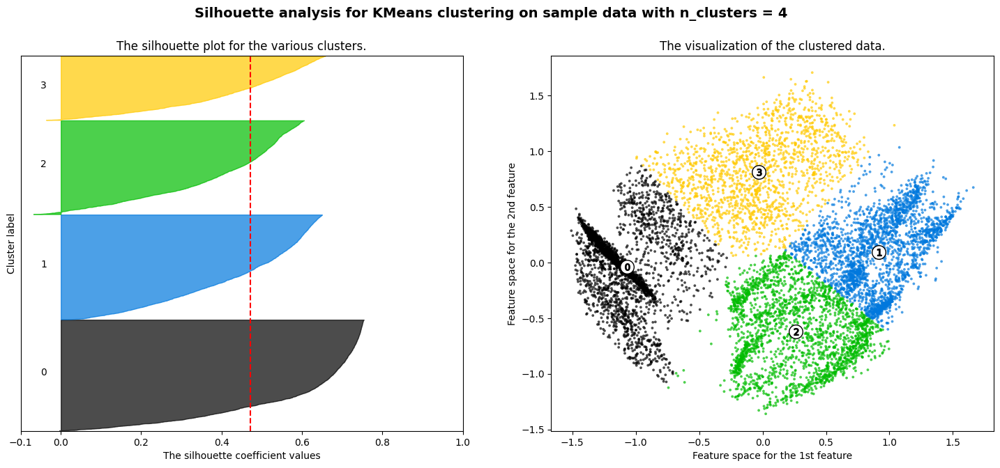

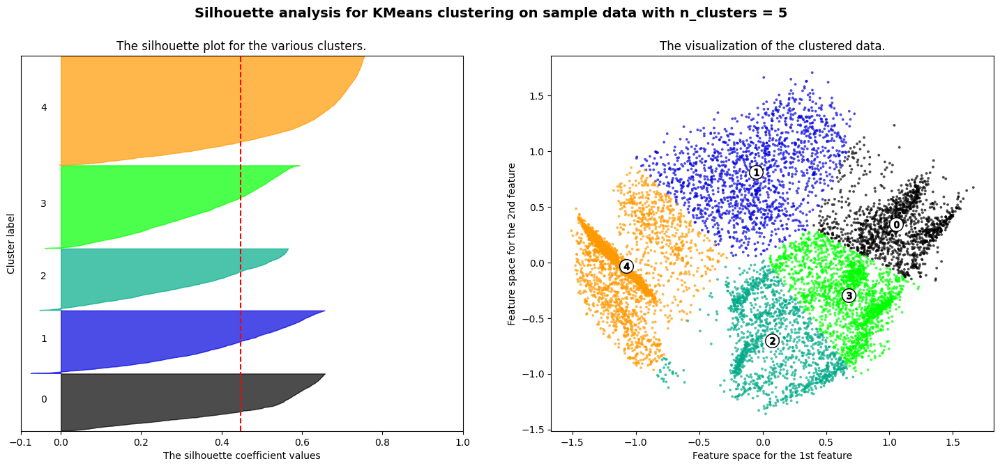

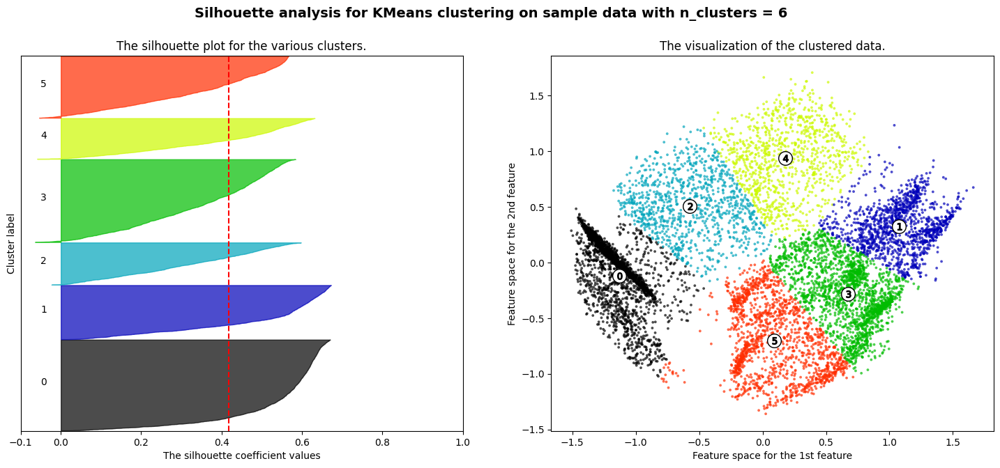

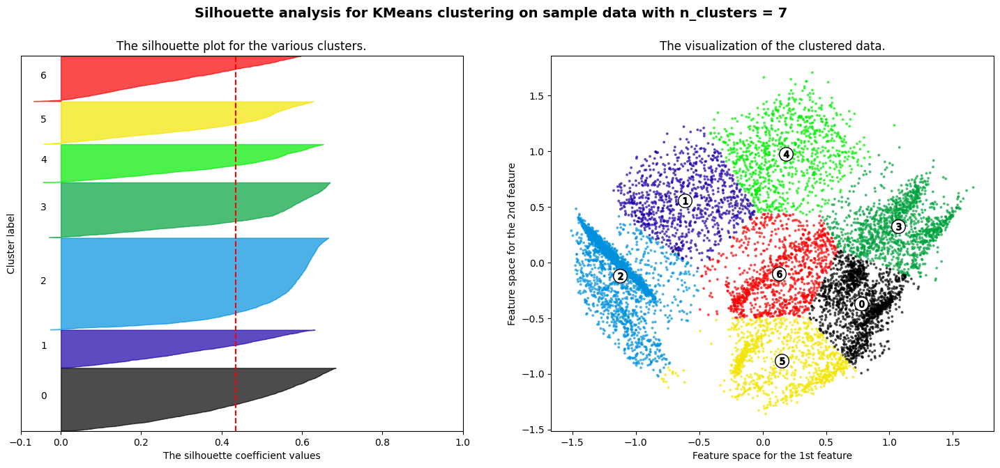

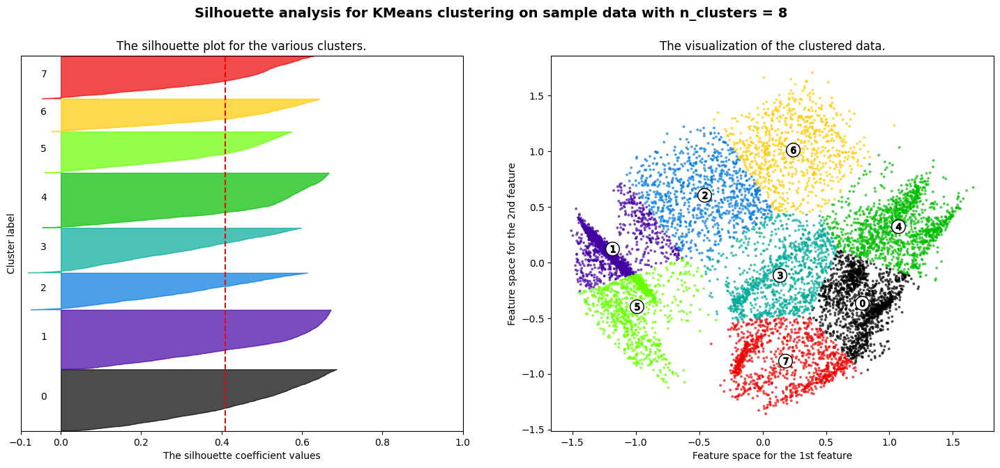

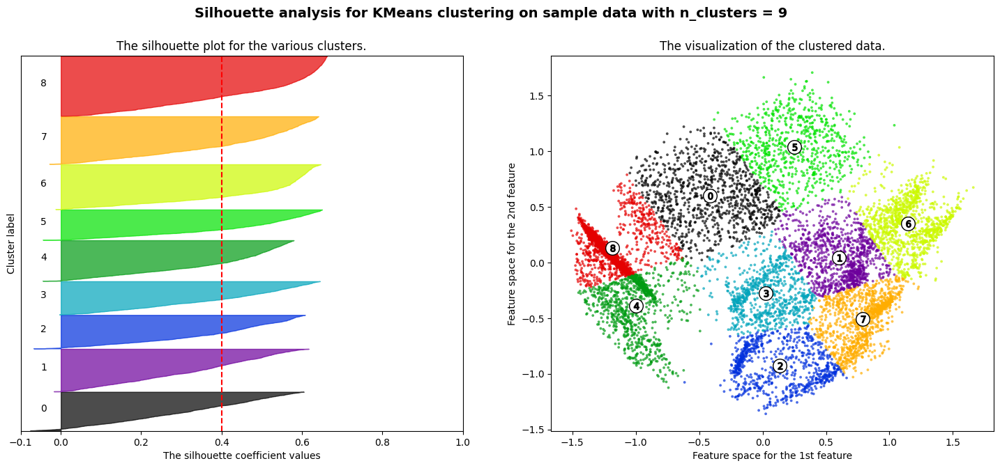

In [25]:
# Silhouette Analysis for KMeans Clustering

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(minx_pca_df) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(minx_pca_df)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(minx_pca_df, cluster_labels)
    print(
        "For n_clusters =",
        n_clusters,
        "The average silhouette_score is :",
        silhouette_avg,
    )

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(minx_pca_df, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(
        minx_pca_df['feat1'], minx_pca_df['feat2'], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
    )

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(
        centers[:, 0],
        centers[:, 1],
        marker="o",
        c="white",
        alpha=1,
        s=200,
        edgecolor="k",
    )

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(
        "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
        % n_clusters,
        fontsize=14,
        fontweight="bold",
    )

plt.show()

# Silhouette Analysis on Standard Scaler

For n_clusters = 2 The average silhouette_score is : 0.44179610836769695
For n_clusters = 3 The average silhouette_score is : 0.434034612166815
For n_clusters = 4 The average silhouette_score is : 0.4314253862588634
For n_clusters = 5 The average silhouette_score is : 0.39656796827585955
For n_clusters = 6 The average silhouette_score is : 0.3854126193391441
For n_clusters = 7 The average silhouette_score is : 0.377765961577914
For n_clusters = 8 The average silhouette_score is : 0.374677158594986
For n_clusters = 9 The average silhouette_score is : 0.37923512378968394


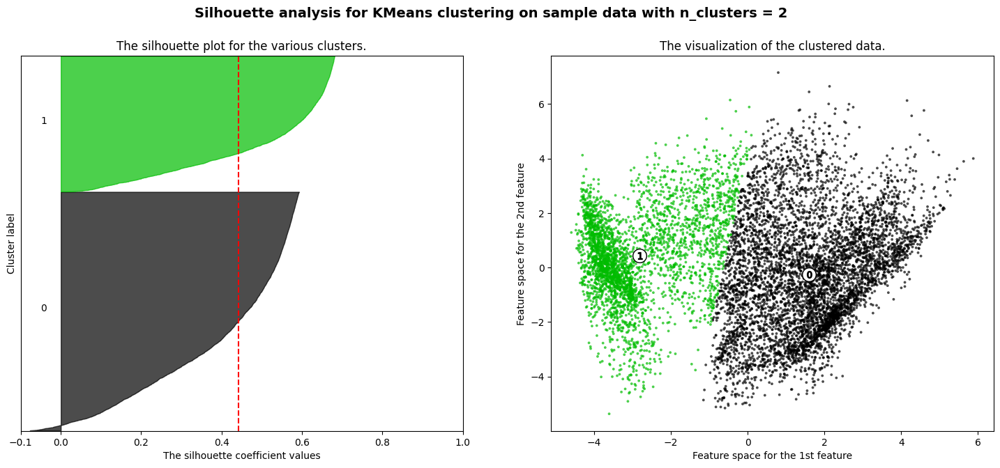

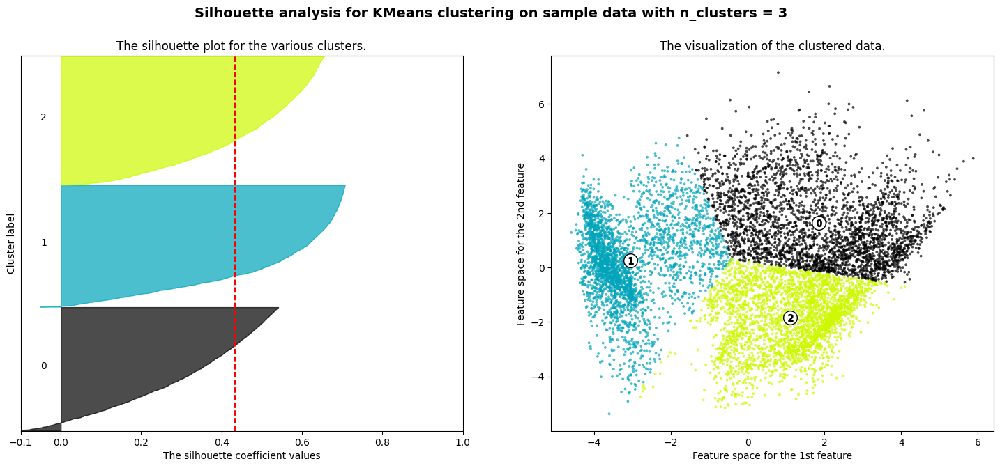

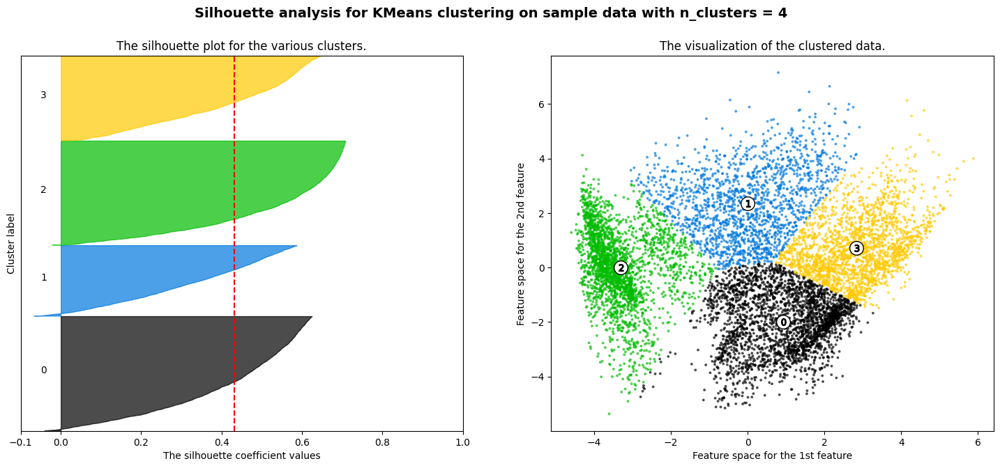

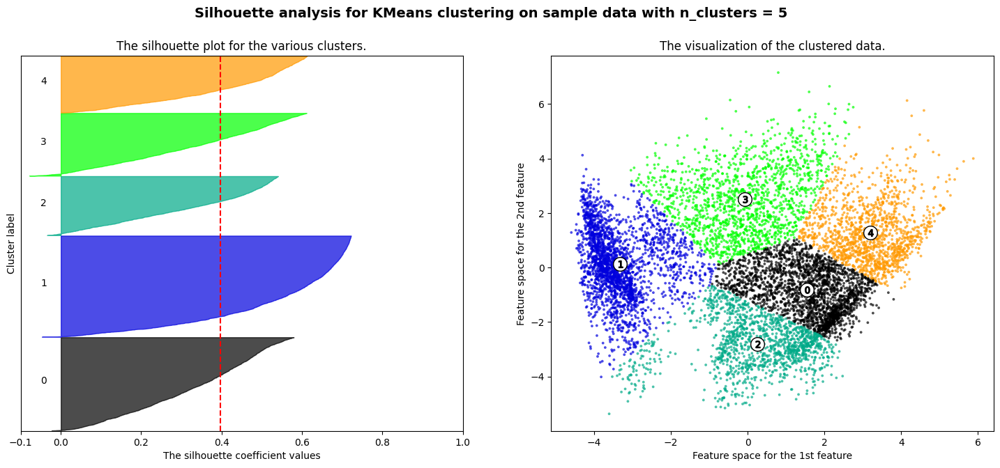

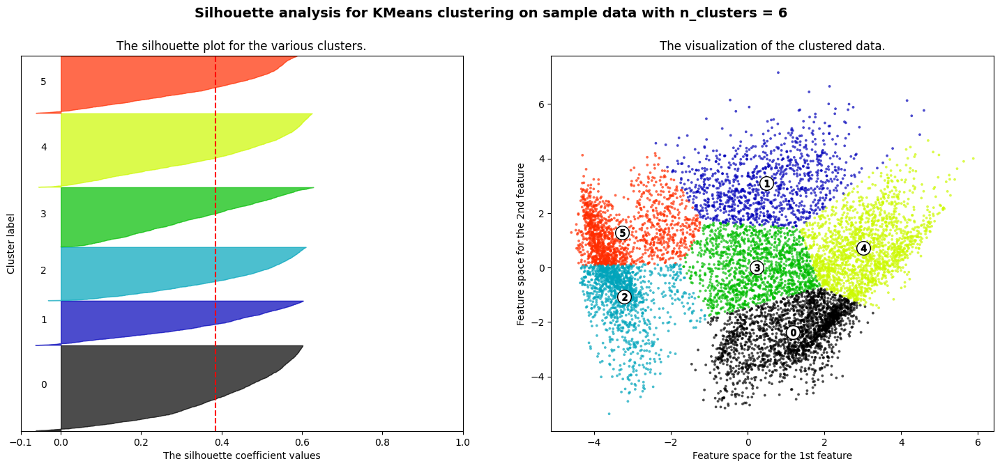

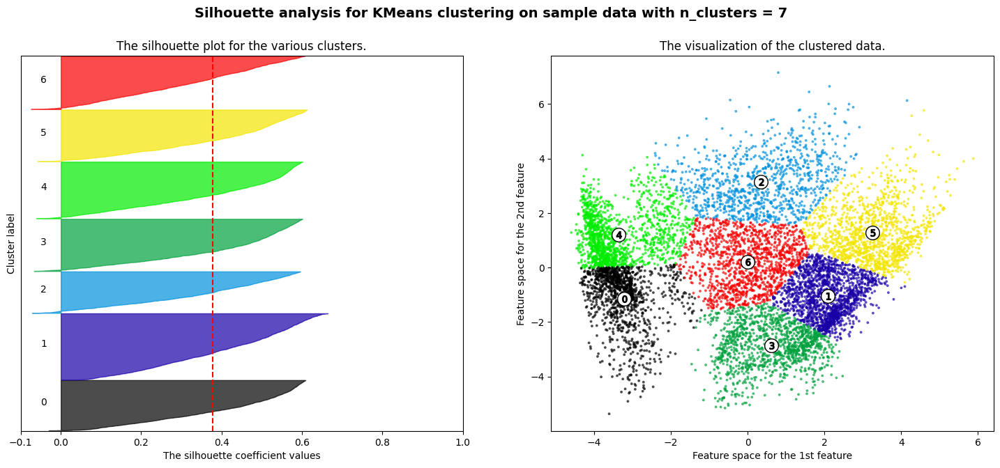

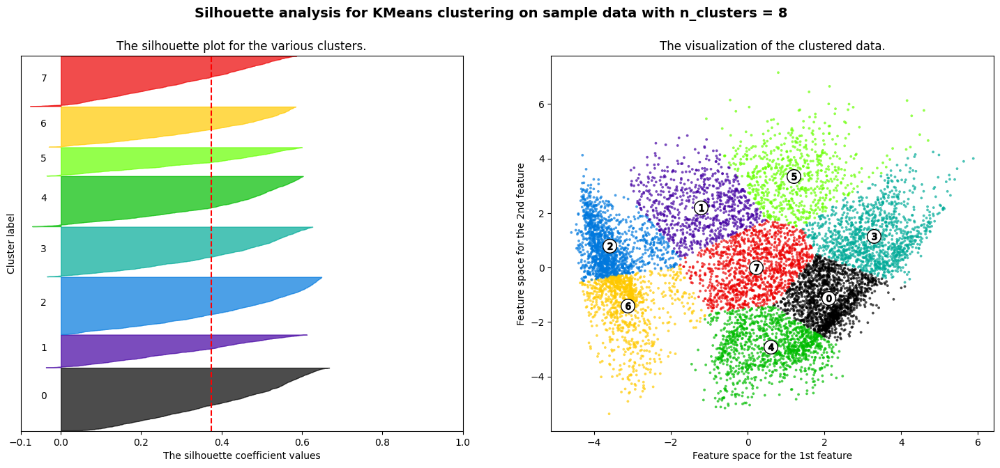

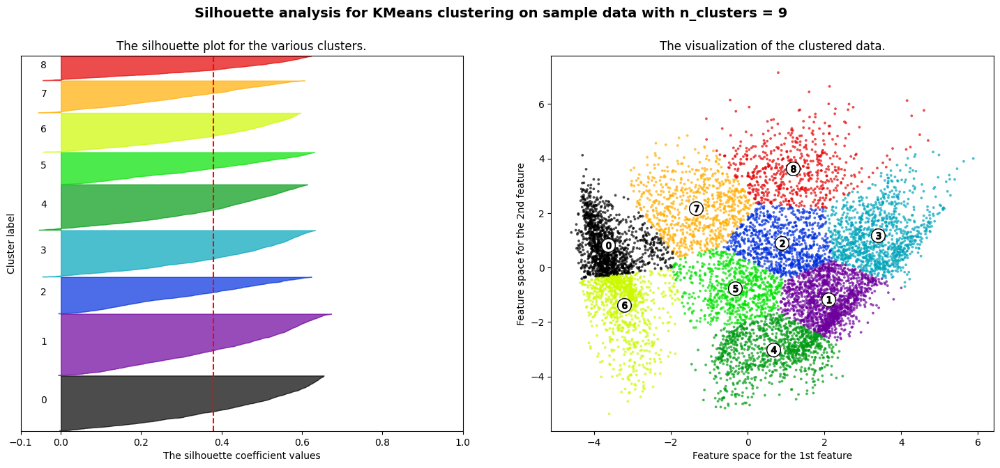

In [26]:
# Silhouette Analysis for KMeans Clustering


for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(stan_pca_df) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(stan_pca_df)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(stan_pca_df, cluster_labels)
    print(
        "For n_clusters =",
        n_clusters,
        "The average silhouette_score is :",
        silhouette_avg,
    )

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(stan_pca_df, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(
        stan_pca_df['feat1'], stan_pca_df['feat2'], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k"
    )

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(
        centers[:, 0],
        centers[:, 1],
        marker="o",
        c="white",
        alpha=1,
        s=200,
        edgecolor="k",
    )

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker="$%d$" % i, alpha=1, s=50, edgecolor="k")

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(
        "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
        % n_clusters,
        fontsize=14,
        fontweight="bold",
    )

plt.show()

# Model Training
Training model with data scaled using Standard scaler

In [27]:
# train model with 7 clusters
kmeans = KMeans(n_clusters = 7, init = 'k-means++', n_init = 10)
cluster_labels = kmeans.fit_predict(stan_pca_df)

In [28]:
# adding cluster column
stan_pca_df['cluster'] = cluster_labels
stan_pca_df.head(3)

,feat1,feat2,cluster
0,-0.341872,-3.029544,4
1,-3.446903,0.986798,3
2,1.380337,1.087417,5


In [29]:
# examine clusters
stan_pca_df['cluster'].value_counts()

cluster
2    1595
3    1366
5    1281
4    1254
6    1243
1    1212
0     999
Name: count, dtype: int64

**Visualize KMeans clusters**

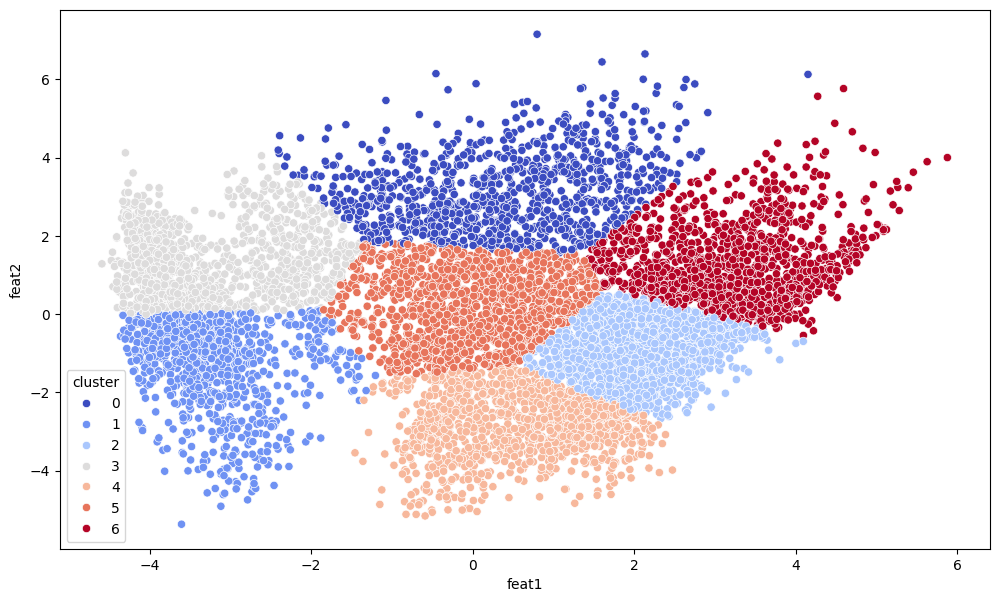

In [30]:
plt.figure(figsize= (12, 7))
sns.scatterplot(data = stan_pca_df, x = 'feat1', y = 'feat2', hue = 'cluster', palette = 'coolwarm', legend = 'full')
plt.show()

# DBSCAN model

In [31]:
epsilons = np.linspace(0.01, 1, num = 15)   # start from 0.01 because starting at 0 won't make the algorithm happy
min_samples = np.arange(2, 30, step = 3)


combinations = list(itertools.product(epsilons, min_samples))
n = len(combinations)
n

150

### DBSCAN Parameter Optimization using Silhouette Score

This function below performs parameter optimization for DBSCAN (Density-Based Spatial Clustering of Applications with Noise) algorithm using silhouette score as the evaluation metric. It takes a list of combinations of epsilon and minimum samples and a feature matrix x as input. For each combination of parameters, DBSCAN is applied to the data, and the silhouette score is computed.

In [32]:
#

def get_scores_and_labels(combinations, x):   # should be numpy array
  scores = []
  all_labels_list = []

  for i, (eps, num_samples) in enumerate(combinations):
    dbscan_model = DBSCAN(eps = eps, min_samples = num_samples)
    dbscan_model.fit(x)
    labels = dbscan_model.labels_
    labels_set = set(labels)
    num_clusters = len(labels_set)

    if -1 in labels_set:
      num_clusters = num_clusters - 1

    if (num_clusters < 2) or (num_clusters >50):
      scores.append(-10)               # append garbage
      all_labels_list.append('bad')

      c = (eps, num_samples)
      print(f'Combinations {c} on iteration {i+1} of {n} has {num_clusters} clusters. Moving on...')
      continue
    scores.append(ss(x, labels))
    all_labels_list.append(labels)
    print(f'index {i}, score: {scores[-1]}, labels: {all_labels_list[-1]}, NumClusters: {num_clusters}')

  best_index = np.argmax(scores)
  best_parameters = combinations[best_index]
  best_labels = all_labels_list[best_index]
  best_score = scores[best_index]

  return {'best_epsilon' : best_parameters[0],
          'best_min_samples' : best_parameters[1],
          'best_labels' : best_labels,
          'best_score' : best_score}

best_dict = get_scores_and_labels(combinations, stan_pca_df)


Combinations (0.01, 2) on iteration 1 of 150 has 346 clusters. Moving on...
Combinations (0.01, 5) on iteration 2 of 150 has 0 clusters. Moving on...
Combinations (0.01, 8) on iteration 3 of 150 has 0 clusters. Moving on...
Combinations (0.01, 11) on iteration 4 of 150 has 0 clusters. Moving on...
Combinations (0.01, 14) on iteration 5 of 150 has 0 clusters. Moving on...
Combinations (0.01, 17) on iteration 6 of 150 has 0 clusters. Moving on...
Combinations (0.01, 20) on iteration 7 of 150 has 0 clusters. Moving on...
Combinations (0.01, 23) on iteration 8 of 150 has 0 clusters. Moving on...
Combinations (0.01, 26) on iteration 9 of 150 has 0 clusters. Moving on...
Combinations (0.01, 29) on iteration 10 of 150 has 0 clusters. Moving on...
Combinations (0.08071428571428571, 2) on iteration 11 of 150 has 743 clusters. Moving on...
Combinations (0.08071428571428571, 5) on iteration 12 of 150 has 268 clusters. Moving on...
Combinations (0.08071428571428571, 8) on iteration 13 of 150 has 1

In [33]:
best_dict

{'best_epsilon': 0.8585714285714285,
 'best_min_samples': 23,
 'best_labels': array([0, 1, 2, ..., 0, 3, 2]),
 'best_score': 0.5705911810024494}

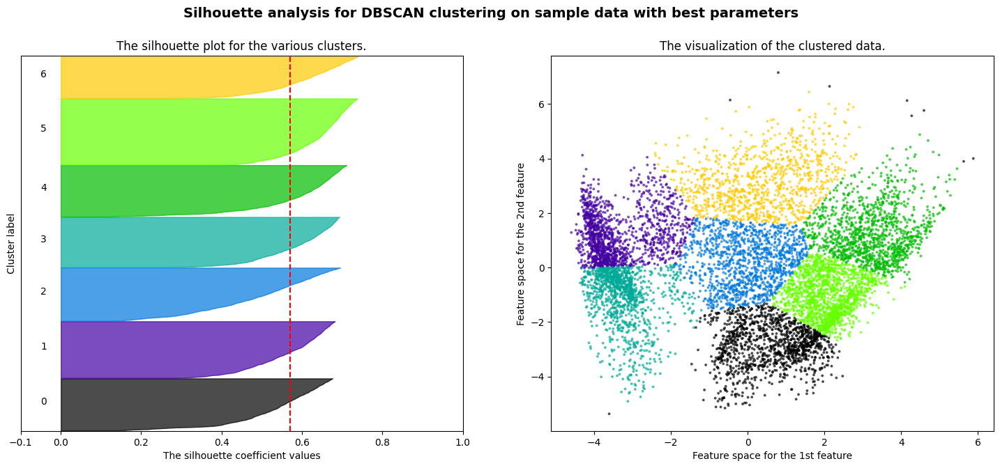

In [40]:
# Visualize Silhouette Analysis for DBSCAN
cluster_labels = best_dict['best_labels']
silhouette_avg = silhouette_score(stan_pca_df, cluster_labels)
sample_silhouette_values = silhouette_samples(stan_pca_df, cluster_labels)

fig, (ax1, ax2) = plt.subplots(1, 2)
fig.set_size_inches(18, 7)

ax1.set_xlim([-0.1, 1])
ax1.set_ylim([0, len(stan_pca_df) + (len(set(cluster_labels)) + 1) * 10])

y_lower = 10
for i in set(cluster_labels):
    if i == -1:
        continue  # Skip noise points
    ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
    ith_cluster_silhouette_values.sort()

    size_cluster_i = ith_cluster_silhouette_values.shape[0]
    y_upper = y_lower + size_cluster_i

    color = cm.nipy_spectral(float(i) / len(set(cluster_labels)))
    ax1.fill_betweenx(np.arange(y_lower, y_upper), 0, ith_cluster_silhouette_values, facecolor=color, edgecolor=color, alpha=0.7)

    ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
    y_lower = y_upper + 10

ax1.set_title("The silhouette plot for the various clusters.")
ax1.set_xlabel("The silhouette coefficient values")
ax1.set_ylabel("Cluster label")
ax1.axvline(x=silhouette_avg, color="red", linestyle="--")
ax1.set_yticks([])
ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

colors = cm.nipy_spectral(cluster_labels.astype(float) / len(set(cluster_labels)))
ax2.scatter(stan_pca_df['feat1'], stan_pca_df['feat2'], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k")

ax2.set_title("The visualization of the clustered data.")
ax2.set_xlabel("Feature space for the 1st feature")
ax2.set_ylabel("Feature space for the 2nd feature")

plt.suptitle("Silhouette analysis for DBSCAN clustering on sample data with best parameters", fontsize=14, fontweight="bold")
plt.show()

In [34]:
# train dbscan model
dbscan_model = DBSCAN(eps = best_dict['best_epsilon'], min_samples = 2)
dbscan_model.fit(stan_pca_df)

stan_pca_df_db = stan_pca_df.copy()
stan_pca_df_db['cluster'] = best_dict['best_labels']

stan_pca_df_db['cluster'].value_counts()

cluster
 5    1595
 1    1366
 2    1281
 0    1254
 4    1239
 3    1211
 6     995
-1       9
Name: count, dtype: int64

## Visualize the DBSCAN clusters

In [35]:
import plotly.express as px

fig = px.scatter(x = stan_pca_df_db['feat1'], y = stan_pca_df_db['feat2'], color = stan_pca_df_db['cluster'])
fig.show()

<Axes: xlabel='feat1', ylabel='feat2'>

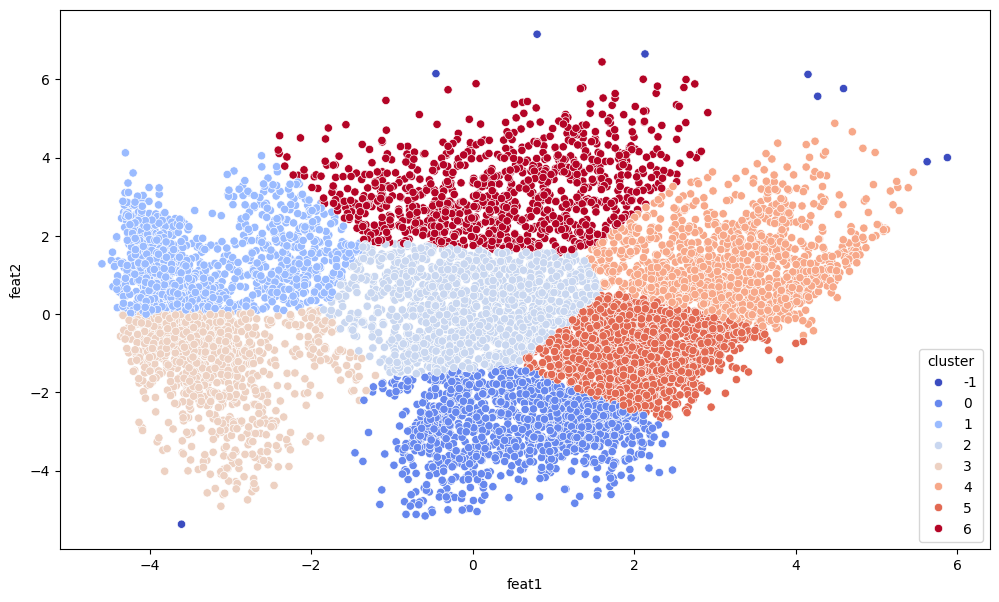

In [36]:
plt.figure(figsize= (12, 7))
sns.scatterplot(data = stan_pca_df_db, x = 'feat1', y = 'feat2', hue = 'cluster', palette = 'coolwarm', legend = 'full')


# HDBSCAN

In [ ]:
!pip install hdbscan

In [38]:
# Define parameter ranges for HDBSCAN
import itertools
import hdbscan
from sklearn.metrics import silhouette_score as ss

min_cluster_sizes = np.arange(5, 80, step=5)
min_samples = np.arange(2, 20, step=2)

combinations = list(itertools.product(min_cluster_sizes, min_samples))
n = len(combinations)

def get_scores_and_labels_hdbscan(combinations, x):   # should be numpy array
    scores = []
    all_labels_list = []

    for i, (min_cluster_size, num_samples) in enumerate(combinations):
        hdbscan_model = hdbscan.HDBSCAN(min_cluster_size=min_cluster_size, min_samples=num_samples)
        labels = hdbscan_model.fit_predict(x)
        labels_set = set(labels)
        num_clusters = len(labels_set)

        if -1 in labels_set:
            num_clusters -= 1

        if (num_clusters < 2) or (num_clusters > 50):
            scores.append(-10)               # append garbage
            all_labels_list.append('bad')

            c = (min_cluster_size, num_samples)
            print(f'Combinations {c} on iteration {i+1} of {n} has {num_clusters} clusters. Moving on...')
            continue

        if len(set(labels)) == 1:
            scores.append(-10)  # append garbage if all points are in one cluster
            all_labels_list.append('bad')
        else:
            scores.append(ss(x, labels))
            all_labels_list.append(labels)

        print(f'index {i}, score: {scores[-1]}, labels: {all_labels_list[-1]}, NumClusters: {num_clusters}')

    best_index = np.argmax(scores)
    best_parameters = combinations[best_index]
    best_labels = all_labels_list[best_index]
    best_score = scores[best_index]

    return {'best_min_cluster_size': best_parameters[0],
            'best_min_samples': best_parameters[1],
            'best_labels': best_labels,
            'best_score': best_score}

best_dict_hdbscan = get_scores_and_labels_hdbscan(combinations, stan_pca_df)


Combinations (5, 2) on iteration 1 of 135 has 93 clusters. Moving on...
index 1, score: 0.564630432283229, labels: [4 2 6 ... 4 3 6], NumClusters: 7
index 2, score: 0.564630432283229, labels: [4 2 5 ... 4 3 5], NumClusters: 7
index 3, score: 0.5633825596741034, labels: [4 2 5 ... 4 3 5], NumClusters: 7
index 4, score: 0.5616269568323731, labels: [4 2 6 ... 4 3 6], NumClusters: 7
index 5, score: 0.5614936293096318, labels: [4 3 5 ... 4 2 5], NumClusters: 7
index 6, score: 0.5607618035718412, labels: [4 3 6 ... 4 2 6], NumClusters: 7
index 7, score: 0.5641270028257575, labels: [4 2 6 ... 4 3 6], NumClusters: 7
index 8, score: 0.5636103840452923, labels: [4 2 6 ... 4 3 6], NumClusters: 7
index 9, score: 0.571615476996467, labels: [2 3 6 ... 2 4 6], NumClusters: 7
index 10, score: 0.564630432283229, labels: [4 2 6 ... 4 3 6], NumClusters: 7
index 11, score: 0.564630432283229, labels: [4 2 5 ... 4 3 5], NumClusters: 7
index 12, score: 0.5633825596741034, labels: [4 2 5 ... 4 3 5], NumCluste

# Visualize Silhouette Analysis for HDBSCAN

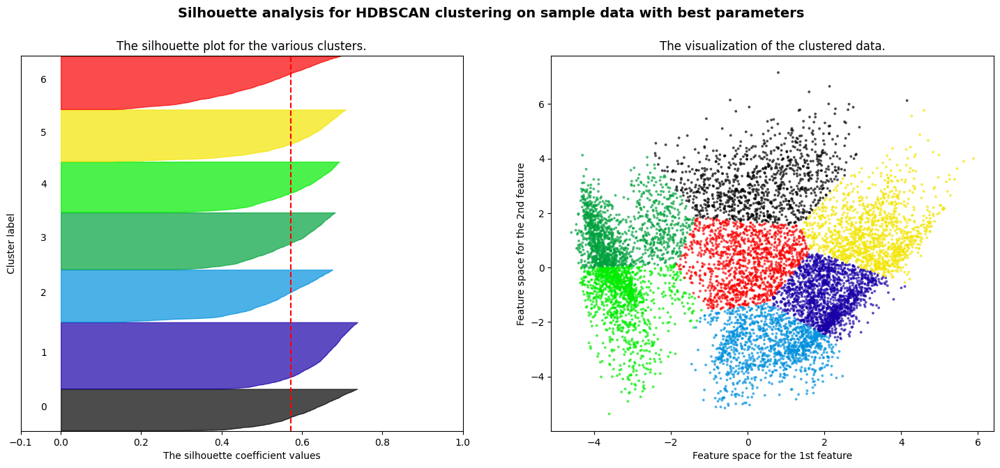

In [41]:
# Visualize Silhouette Analysis for HDBSCAN
cluster_labels = best_dict_hdbscan['best_labels']
silhouette_avg = silhouette_score(stan_pca_df, cluster_labels)
sample_silhouette_values = silhouette_samples(stan_pca_df, cluster_labels)

fig, (ax1, ax2) = plt.subplots(1, 2)
fig.set_size_inches(18, 7)

ax1.set_xlim([-0.1, 1])
ax1.set_ylim([0, len(stan_pca_df) + (len(set(cluster_labels)) + 1) * 10])

y_lower = 10
for i in set(cluster_labels):
    if i == -1:
        continue  # Skip noise points
    ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
    ith_cluster_silhouette_values.sort()

    size_cluster_i = ith_cluster_silhouette_values.shape[0]
    y_upper = y_lower + size_cluster_i

    color = cm.nipy_spectral(float(i) / len(set(cluster_labels)))
    ax1.fill_betweenx(np.arange(y_lower, y_upper), 0, ith_cluster_silhouette_values, facecolor=color, edgecolor=color, alpha=0.7)

    ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
    y_lower = y_upper + 10

ax1.set_title("The silhouette plot for the various clusters.")
ax1.set_xlabel("The silhouette coefficient values")
ax1.set_ylabel("Cluster label")
ax1.axvline(x=silhouette_avg, color="red", linestyle="--")
ax1.set_yticks([])
ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

colors = cm.nipy_spectral(cluster_labels.astype(float) / len(set(cluster_labels)))
ax2.scatter(stan_pca_df['feat1'], stan_pca_df['feat2'], marker=".", s=30, lw=0, alpha=0.7, c=colors, edgecolor="k")

ax2.set_title("The visualization of the clustered data.")
ax2.set_xlabel("Feature space for the 1st feature")
ax2.set_ylabel("Feature space for the 2nd feature")

plt.suptitle("Silhouette analysis for HDBSCAN clustering on sample data with best parameters", fontsize=14, fontweight="bold")
plt.show()

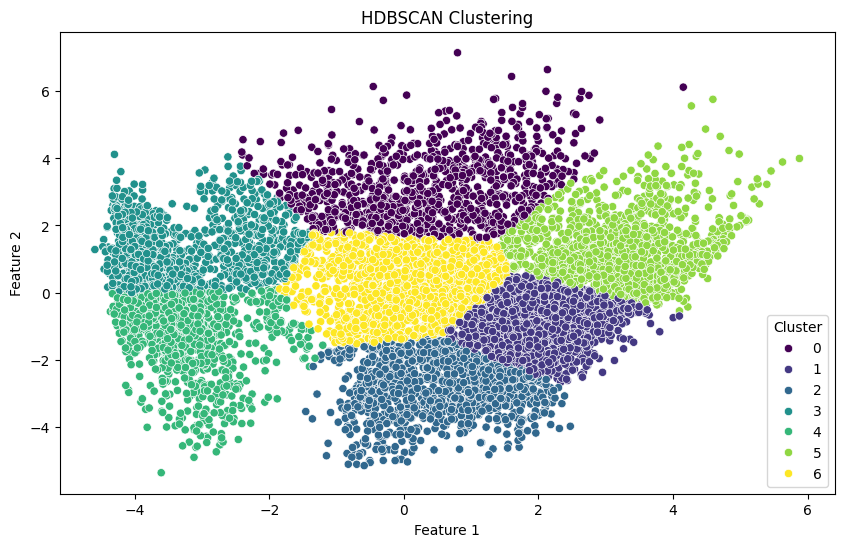

In [39]:
# Train the HDBSCAN model with the best parameters
hdbscan_model = hdbscan.HDBSCAN(min_cluster_size = best_dict_hdbscan['best_min_cluster_size'],
                                min_samples = best_dict_hdbscan['best_min_samples'])
hdbscan_model.fit(stan_pca_df)

# Add cluster labels to the DataFrame
stan_pca_df_hbdscan = stan_pca_df.copy()
stan_pca_df_hbdscan['cluster'] = best_dict_hdbscan['best_labels']

# Visualize the clusters
plt.figure(figsize=(10, 6))
sns.scatterplot(x = 'feat1', y = 'feat2', hue='cluster', palette='viridis', data = stan_pca_df_hbdscan, legend = 'full')
plt.title('HDBSCAN Clustering')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.legend(title='Cluster')
plt.show()

# Conclusion

In this project, we performed customer segmentation using three different clustering algorithms: KMeans, DBSCAN, and HDBSCAN. Here are the key takeaways from our analysis


1.   KMeans Clustering:
The Silhouette analysis for KMeans clustering indicated poor clustering performance, with the best average Silhouette score being around 0.44 data scaled with standard scaler. This suggests that KMeans struggled to form well-defined clusters for this dataset.

2.  DBSCAN Clustering:
The DBSCAN algorithm showed better performance, with a best Silhouette score of approximately 0.57. DBSCAN's ability to handle noise and outliers allowed for the identification of more meaningful clusters, albeit with some variability in cluster sizes and shapes.

3. HDBSCAN Clustering:
HDBSCAN performed comparably to DBSCAN, also achieving a best Silhouette score of 0.57. HDBSCAN's flexibility in identifying clusters of varying densities and its ability to label noise points contributed to its effectiveness in clustering the data.
        
   


    

Overall, while KMeans struggled with this dataset, both DBSCAN and HDBSCAN demonstrated better clustering performance, providing valuable insights into customer segments. By leveraging these clustering techniques, we can better understand customer behavior and tailor marketing efforts to different segments, ultimately enhancing customer satisfaction and business outcomes.